# **INTEGRANTES**

**Completar con el nombre y la libreta universitaria de cada integrante**

**INTEGRANTE Nº1:**

**INTEGRANTE Nº2:**

# Ejercicio 4: Dinámica de los modos

En este ejercicio continuamos con la ecuación de Schrödinger no lineal adimensional obtenida en el ejercicio anterior,

$$
i\,\frac{\partial a}{\partial t}
=
-\frac{\partial^2 a}{\partial x^2}
+\beta |a|^2a.
$$

Equivalentemente, para integrarla en el tiempo escribimos

$$
\frac{\partial a}{\partial t}
=
i\,\frac{\partial^2 a}{\partial x^2}
-i\beta |a|^2a.
$$

La diferencia con el Ejercicio 3 es que ahora reemplazamos Euler explícito por Runge--Kutta de orden 4. Esto mejora mucho la precisión temporal, lo cual es importante porque la ecuación conserva la cantidad

$$
E(t)=\int |a(x,t)|^2\,dx.
$$

En el código usamos condiciones periódicas y derivadas espaciales calculadas por FFT.

## 4(a): Integrador pseudoespectral con RK4

Trabajamos en el dominio periódico $x\in[0,2\pi)$ y representamos

$$
a(x,t)=\sum_k a_k(t)e^{ikx}.
$$

Entonces

$$
\frac{\partial^2 a}{\partial x^2}
\longleftrightarrow
-k^2a_k.
$$

La parte no lineal $|a|^2a$ se calcula en el espacio físico y luego se transforma a Fourier. Como este producto cúbico puede generar modos espurios por aliasing, se aplica un filtro de de-aliasing antes de volver al espacio físico.

In [5]:
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams.update({
    "figure.figsize": (10, 4),
    "axes.grid": True,
    "font.size": 11,
})

# Dominio periódico y grilla espacial.
#
# Usamos N=64 para que el RK4 explícito sea estable con dt=1e-3.
# La parte lineal contiene factores k^2, por lo que modos demasiado altos
# fuerzan pasos temporales mucho más chicos.
N = 64
L = 2*np.pi
x = L*np.arange(N)/N
dx = L/N

# Modos enteros compatibles con el dominio [0, 2*pi).
k = np.fft.fftfreq(N, d=1/N)

# Para la regla 2/3, conservamos aproximadamente |k| < N/3.
k_dealias = N//3


def dealias(f_hat):
    '''Apaga modos altos para reducir aliasing en el término no lineal.'''
    f_hat = f_hat.copy()
    f_hat[np.abs(k) >= k_dealias] = 0.0
    return f_hat


def energia(a):
    '''Energía discreta proporcional a la integral de |a|^2.'''
    return dx*np.sum(np.abs(a)**2)


def rhs_nls(a, beta):
    '''
    Lado derecho de

        a_t = i a_xx - i beta |a|^2 a.

    La derivada segunda se calcula en Fourier y la no linealidad en x.
    '''
    a_hat = np.fft.fft(a)
    a_xx = np.fft.ifft(-(k**2)*a_hat)

    nonlinear = np.abs(a)**2*a
    nonlinear_hat = dealias(np.fft.fft(nonlinear))
    nonlinear_dealias = np.fft.ifft(nonlinear_hat)

    return 1j*a_xx - 1j*beta*nonlinear_dealias


def paso_rk4(a, dt, beta):
    '''Un paso temporal de Runge--Kutta clásico de orden 4.'''
    k1 = rhs_nls(a, beta)
    k2 = rhs_nls(a + 0.5*dt*k1, beta)
    k3 = rhs_nls(a + 0.5*dt*k2, beta)
    k4 = rhs_nls(a + dt*k3, beta)
    return a + dt*(k1 + 2*k2 + 2*k3 + k4)/6


def integrar(a0, beta, tf, dt, guardar_cada=10):
    '''
    Integra desde t=0 hasta t=tf.

    Para no guardar miles de pasos, se almacena una muestra cada guardar_cada pasos.
    '''
    n_steps = int(np.ceil(tf/dt))
    dt = tf/n_steps

    muestras = [a0.copy()]
    tiempos = [0.0]
    energias = [energia(a0)]

    a = a0.copy()
    for n in range(1, n_steps + 1):
        a = paso_rk4(a, dt, beta)
        if n % guardar_cada == 0 or n == n_steps:
            muestras.append(a.copy())
            tiempos.append(n*dt)
            energias.append(energia(a))

    return np.array(tiempos), np.array(muestras), np.array(energias)


def condicion_bicromatica(amplitud=1.0):
    '''Condición inicial del Ejercicio 3: modos k=1 y k=2.'''
    return amplitud*(np.exp(1j*x) + np.exp(2j*x))

Repetimos ahora la condición inicial bicromática del ejercicio anterior,

$$
a(x,0)=e^{ix}+e^{2ix},
$$

e integramos hasta $t=2$ para $\beta=-1$ y $\beta=1$.

El signo de $\beta$ cambia el carácter de la no linealidad: para $\beta<0$ la interacción es de tipo focalizante, mientras que para $\beta>0$ es defocalizante. En ambos casos esperamos que la no linealidad transfiera amplitud hacia otros modos, pero la forma concreta de la evolución puede cambiar.

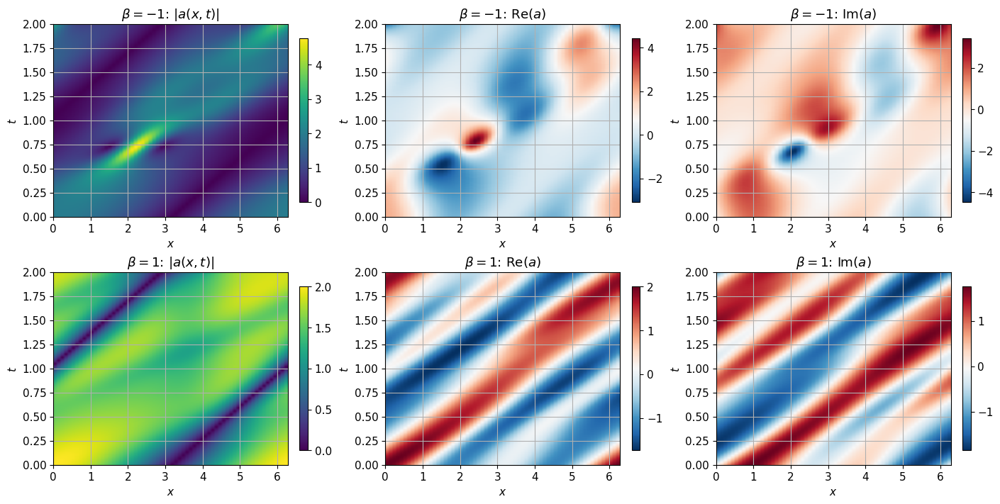

In [6]:
# Parámetros temporales para la comparación pedida en 4(a).
tf_a = 2.0
dt_a = 1e-3
guardar_cada_a = 5

a0_bicromatica = condicion_bicromatica(amplitud=1.0)

resultados_a = {}
for beta in [-1, 1]:
    t, A, E = integrar(
        a0_bicromatica,
        beta=beta,
        tf=tf_a,
        dt=dt_a,
        guardar_cada=guardar_cada_a,
    )
    resultados_a[beta] = {"t": t, "A": A, "E": E}


fig, axes = plt.subplots(2, 3, figsize=(14, 7), constrained_layout=True)

for fila, beta in enumerate([-1, 1]):
    t = resultados_a[beta]["t"]
    A = resultados_a[beta]["A"]

    # Mostramos módulo, parte real y parte imaginaria para ver fases y amplitudes.
    cantidades = [
        (np.abs(A), r"$|a(x,t)|$"),
        (A.real, r"$\operatorname{Re}(a)$"),
        (A.imag, r"$\operatorname{Im}(a)$"),
    ]

    for col, (Z, titulo) in enumerate(cantidades):
        ax = axes[fila, col]
        im = ax.imshow(
            Z,
            origin="lower",
            aspect="auto",
            extent=[0, 2*np.pi, t[0], t[-1]],
            cmap="viridis" if col == 0 else "RdBu_r",
        )
        ax.set_title(fr"$\beta={beta}$: {titulo}")
        ax.set_xlabel(r"$x$")
        ax.set_ylabel(r"$t$")
        fig.colorbar(im, ax=ax, shrink=0.85)

plt.show()

### Animación de la evolución para 4(a)

El mapa espacio-temporal anterior resume toda la simulación en una sola imagen. Para ver mejor la dinámica, animamos el módulo $|a(x,t)|$ para los dos signos de $\beta$.

La animación permite distinguir rápidamente si la amplitud se transporta, si se concentra, si se dispersa o si aparecen estructuras más finas durante la evolución.

In [7]:
import matplotlib.animation as animation
from IPython.display import HTML


def animar_modulos_bicromatica(resultados, betas=(-1, 1), paso=2):
    '''Anima |a(x,t)| para comparar beta=-1 y beta=1.'''
    fig, axes = plt.subplots(1, len(betas), figsize=(12, 4), constrained_layout=True)
    if len(betas) == 1:
        axes = [axes]

    lineas = []
    for ax, beta in zip(axes, betas):
        t = resultados[beta]["t"]
        A = resultados[beta]["A"]
        linea, = ax.plot(x, np.abs(A[0]), lw=2)
        ax.set_xlim(0, 2*np.pi)
        ax.set_ylim(0, 1.1*np.max(np.abs(A)))
        ax.set_xlabel(r"$x$")
        ax.set_ylabel(r"$|a(x,t)|$")
        ax.set_title(fr"$\beta={beta}$, $t={t[0]:.2f}$")
        lineas.append((linea, ax, t, A, beta))

    frames = range(0, len(resultados[betas[0]]["t"]), paso)

    def actualizar(frame):
        artistas = []
        for linea, ax, t, A, beta in lineas:
            linea.set_ydata(np.abs(A[frame]))
            ax.set_title(fr"$\beta={beta}$, $t={t[frame]:.2f}$")
            artistas.append(linea)
        return artistas

    anim = animation.FuncAnimation(
        fig,
        actualizar,
        frames=frames,
        interval=60,
        blit=False,
    )
    plt.close(fig)
    return anim


anim_4a = animar_modulos_bicromatica(resultados_a, betas=(-1, 1), paso=2)
HTML(anim_4a.to_jshtml())

## 4(b): Ruido blanco en Fourier y espectro espacio-temporal

Ahora fijamos $\beta=1$ y tomamos una condición inicial aleatoria en Fourier:

$$
|a_k(0)|=\alpha,
\qquad
|k|<k_{\max}.
$$

La fase de cada modo se elige al azar. Al transformar de vuelta a espacio físico obtenemos una perturbación compleja con muchos modos inicialmente activos.

Para analizar la relación de dispersión calculamos el espectro espacio-temporal. Si la dinámica fuera puramente lineal, cada modo de Fourier evolucionaría como

$$
a_k(t)\sim e^{-ik^2t},
$$

de modo que la energía espectral se concentraría cerca de la parábola

$$
\omega=k^2,
$$

salvo la convención de signo de la transformada temporal. Al aumentar $\alpha$, el término no lineal $\beta |a|^2a$ pesa más y el espectro deja de estar tan concentrado sobre la curva lineal.

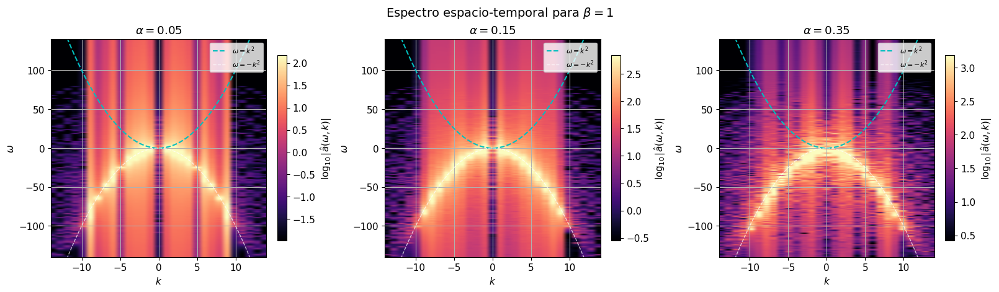

In [8]:
def condicion_ruido_fourier(alpha, kmax, seed=0):
    '''
    Construye una condición inicial con |a_k| = alpha para |k| < kmax.

    Como a es compleja, no imponemos simetría Hermítica. Esto es consistente
    con la ecuación para una amplitud compleja.
    '''
    rng = np.random.default_rng(seed)
    a_hat = np.zeros(N, dtype=complex)
    mascara = (np.abs(k) > 0) & (np.abs(k) < kmax)
    fases = rng.uniform(0, 2*np.pi, size=mascara.sum())

    # Usamos la normalización de numpy: ifft(a_hat) contiene el factor 1/N.
    # Multiplicamos por N para que los coeficientes físicos tengan tamaño alpha.
    a_hat[mascara] = N*alpha*np.exp(1j*fases)
    return np.fft.ifft(a_hat)


def espectro_espaciotemporal(A, dt_muestreo):
    '''
    Espectro 2D de A(t,x).

    Devuelve omega, k_ordenado y log10 del módulo espectral.
    '''
    nt, nx = A.shape
    spec = np.fft.fftshift(np.fft.fft2(A), axes=(0, 1))
    omega = np.fft.fftshift(2*np.pi*np.fft.fftfreq(nt, d=dt_muestreo))
    k_ord = np.fft.fftshift(np.fft.fftfreq(nx, d=1/nx))
    log_spec = np.log10(np.abs(spec) + 1e-12)
    return omega, k_ord, log_spec


# Parámetros de la simulación con ruido.
beta_b = 1
tf_b = 5.0
dt_b = 1e-3
guardar_cada_b = 5
dt_muestreo_b = dt_b*guardar_cada_b
kmax_ruido = 10
alphas = [0.05, 0.15, 0.35]

resultados_b = {}
for alpha in alphas:
    a0 = condicion_ruido_fourier(alpha=alpha, kmax=kmax_ruido, seed=1234)
    t, A, E = integrar(a0, beta=beta_b, tf=tf_b, dt=dt_b, guardar_cada=guardar_cada_b)
    resultados_b[alpha] = {"t": t, "A": A, "E": E}


fig, axes = plt.subplots(1, len(alphas), figsize=(16, 4.6), constrained_layout=True)

for ax, alpha in zip(axes, alphas):
    A = resultados_b[alpha]["A"]
    omega, k_ord, log_spec = espectro_espaciotemporal(A, dt_muestreo_b)

    im = ax.imshow(
        log_spec,
        origin="lower",
        aspect="auto",
        extent=[k_ord[0], k_ord[-1], omega[0], omega[-1]],
        cmap="magma",
        vmin=np.percentile(log_spec, 65),
        vmax=np.percentile(log_spec, 99.8),
    )

    # Guías de la relación lineal. El signo puede verse invertido según la convención FFT.
    kk = np.linspace(-kmax_ruido - 4, kmax_ruido + 4, 300)
    ax.plot(kk, kk**2, "c--", lw=1.5, label=r"$\omega=k^2$")
    ax.plot(kk, -kk**2, "w--", lw=1.0, alpha=0.7, label=r"$\omega=-k^2$")

    ax.set_xlim(-14, 14)
    ax.set_ylim(-140, 140)
    ax.set_title(fr"$\alpha={alpha}$")
    ax.set_xlabel(r"$k$")
    ax.set_ylabel(r"$\omega$")
    ax.legend(loc="upper right", fontsize=8)
    fig.colorbar(im, ax=ax, shrink=0.85, label=r"$\log_{10}|\hat a(\omega,k)|$")

fig.suptitle(r"Espectro espacio-temporal para $\beta=1$", fontsize=14)
plt.show()

## 4(c): Conservación aproximada de la energía

Analíticamente, para condiciones periódicas o condiciones de borde que anulen los términos de borde, la cantidad

$$
E(t)=\int |a(x,t)|^2\,dx
$$

se conserva. En la simulación numérica no esperamos conservación exacta, porque usamos paso temporal finito, grilla finita y de-aliasing. Lo que sí esperamos es que el error sea pequeño y no crezca de manera descontrolada si $\Delta t$ fue elegido razonablemente.

Graficamos

$$
\Delta E(t)=E(t)-E(0)
$$

en escala semilogarítmica.

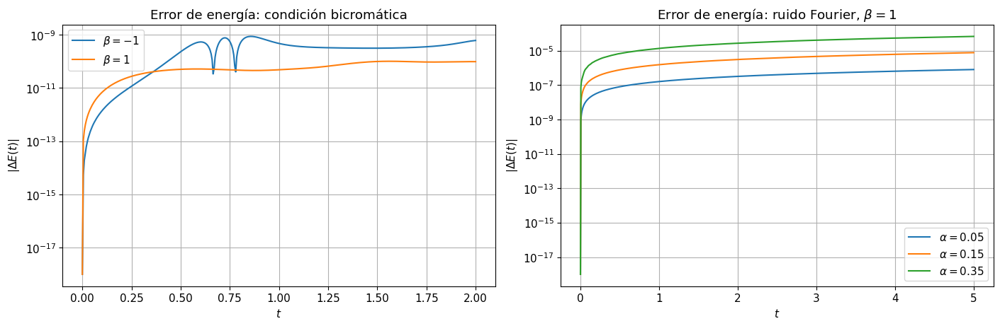

In [9]:
fig, axes = plt.subplots(1, 2, figsize=(14, 4.5), constrained_layout=True)

# Energía para las simulaciones bicromáticas de 4(a).
for beta in [-1, 1]:
    t = resultados_a[beta]["t"]
    E = resultados_a[beta]["E"]
    axes[0].semilogy(t, np.abs(E - E[0]) + 1e-18, label=fr"$\beta={beta}$")

axes[0].set_title("Error de energía: condición bicromática")
axes[0].set_xlabel(r"$t$")
axes[0].set_ylabel(r"$|\Delta E(t)|$")
axes[0].legend()

# Energía para las simulaciones con ruido de 4(b).
for alpha in alphas:
    t = resultados_b[alpha]["t"]
    E = resultados_b[alpha]["E"]
    axes[1].semilogy(t, np.abs(E - E[0]) + 1e-18, label=fr"$\alpha={alpha}$")

axes[1].set_title(r"Error de energía: ruido Fourier, $\beta=1$")
axes[1].set_xlabel(r"$t$")
axes[1].set_ylabel(r"$|\Delta E(t)|$")
axes[1].legend()

plt.show()

## Conclusión del ejercicio

El cambio de Euler a RK4 permite seguir la dinámica de los modos con mucha más estabilidad temporal. Para la condición bicromática, la evolución no queda restringida a los modos iniciales $k=1$ y $k=2$: el término cúbico $|a|^2a$ mezcla modos y redistribuye amplitud en el espectro.

En el caso de ruido blanco con $\beta=1$, para amplitudes pequeñas el espectro espacio-temporal permanece concentrado cerca de la relación lineal de dispersión,

$$
\omega=k^2,
$$

teniendo en cuenta el signo que introduce la convención de la FFT temporal. Cuando aumenta $\alpha$, la no linealidad se vuelve comparable con la parte dispersiva y el espectro se ensancha: aparecen transferencias entre modos y la parábola lineal deja de describir toda la dinámica.

Finalmente, los gráficos de $|\Delta E(t)|$ muestran que la energía se conserva aproximadamente. El error no es exactamente cero porque el esquema es discreto, pero para el paso temporal elegido se mantiene pequeño en las escalas simuladas.